# 高频因子

## 需要用到的所有模块

In [1]:
import os
import mat73
import logging
import colorlog
import numpy as np
import pandas as pd

from tqdm import tqdm
from datetime import datetime
from matplotlib import pyplot as plt

## 需要用到的所有函数

In [2]:
# 配置日志对象
def get_logger(level=logging.DEBUG):
	logging.getLogger('matplotlib').setLevel(logging.CRITICAL)
	logger = logging.getLogger()
	logger.setLevel(level)
	console_handler = logging.StreamHandler()
	console_handler.setLevel(level)
	color_formatter = colorlog.ColoredFormatter(
		"%(log_color)s%(levelname)s: %(message)s",
		log_colors={
			"DEBUG": "cyan",
			"INFO": "green",
			"WARNING": "yellow",
			"ERROR": "red",
			"CRITICAL": "red,bg_white",
		},
	)
	console_handler.setFormatter(color_formatter)
	for handler in logger.handlers:
		logger.removeHandler(handler)
	logger.addHandler(console_handler)
	return logger


def ts_Delay(df, num ):
	df = df.shift(num)   # shift, like:  df.shift(1), let yesterday's data to today 
	return df    
 
def ts_Mean(df, num):                # equal weight
	df = df.rolling(window=num).mean()
	return df
    
def ts_Decay(df, num):   # decayed weight: linear change
	df = df.ewm(span=num, adjust=False).mean()
	return df

def ts_Max(df, num):                # get the max value of last num trading day
	df = df.rolling(window=num).max()
	return df

def ts_Min(df, num):             # get the min value of last num trading day  
	df = df.rolling(window=num).min()
	return df

def ts_Stdev(df, num):             # get the min value of last num trading day  
	df = df.rolling(num).std()
	return df

def ts_Sum(dfCleaned, num):
	stds = dfCleaned.rolling(window=num).sum()
	return stds

def ts_Median(Close, num):
	stds = Close.rolling(window=num).median()
	return stds

def ts_Kurtosis(Close, num):
	stds = Close.rolling(window=num).kurt()
	return stds

def ts_Skewness(Close, num):
	stds = Close.rolling(window=num).skew()
	return stds

# 将Matlab时间转化为UNIX时间戳
def matlab_time_to_unix_timestap(matlab_time):
	DAYS_SINCE_0000 = 719529
	SECONDS_IN_A_DAY = 86400
	SECONDS_IN_AN_HOUR = 3600
	TIME_ZONE = 8
	return (matlab_time - DAYS_SINCE_0000) * SECONDS_IN_A_DAY + TIME_ZONE * SECONDS_IN_AN_HOUR


# 全局的日志对象
logger = get_logger()

## 定义高频因子

In [3]:
# 定义高频因子
high_freq_factor = {
 	'高频收益方差' : 'ts_Sum((Close/ts_Delay(Close,1)-1)*(Close/ts_Delay(Close,1)-1),15)',
    '高频收益峰度' : 'ts_Kurtosis(Close/ts_Delay(Close,1)-1,15)',
    '高频收益偏度' : 'ts_Skewness(Close/ts_Delay(Close,1)-1,15)',
    '五分钟特质残差峰度' : 'ts_Kurtosis(Close-ts_Mean(Close,5),5)',
    '上下午成交量比值' :  'ts_Decay(Volume/ts_Delay(Volume,120),10)',
    '一分钟ILLIQ': '(Close/ts_Delay(Close,1)-1).abs()/Amount',
    '趋势强度': '(Close-ts_Delay(Close,240))/ts_Sum((Close-ts_Delay(Close,1)).abs(),240)',
    '五分钟交易额分布': 'ts_Mean(Volume/ts_Sum(Volume,240),5)'
}

## 定义计算高频因子需要用到的函数

In [4]:

# 对因子值进行Panel Normalization
# calculator pn
import math
import scipy.stats as st
##  PN
# convert list to matrix， but every column have same value to the list
def Repmat(f_,lowBan):
    a = np.array([lowBan.values]).T
    c = np.tile(a,len(f_.columns))
    try:
        z = pd.DataFrame(c, index = f_.index, columns = f_.columns)
    except:
        c = np.reshape(c,(np.shape(c)[1],np.shape(c)[2]))
        z = pd.DataFrame(c, index = f_.index, columns = f_.columns)
    return z
def pn_TransNorm(dfCleaned ):  # normalization
    # dfCleaned = pd.DataFrame({'a':[2.3,-1.7,5,3],'b':[6,2.9,-3.1,8],'c':[4,5.9,-6.11,8.1],'d':[7,22,-3.21,81],'e':[9,12,-1.21,11]},index=['one','two','three','four'])
    rank1 = dfCleaned.rank(axis = 1)
    rank2  = rank1.count(1)
    rank22 = Repmat(rank1,rank2)
    rank23 = Repmat(rank1,1/2/rank2)
    rank4 = (rank1-1) / rank22
    rank5 = rank4 + rank23
    rank6 = rank5.copy(deep=True)
    z = np.array(rank6)
    zz=  st.norm.ppf(z )
    zzz = pd.DataFrame(zz,index =rank6.index,columns = rank6.columns )
    return zzz

# 计算因子值的多头和空头权重
def get_long_short_percent(factor_value):
	# 多头权重
    z_up = factor_value.copy()
    z_up[z_up < 0] = 0
    z_up = z_up.div(z_up.sum(1), axis=0)
	# 空头权重
    z_dn = factor_value.copy()
    z_dn[z_dn > 0] = 0
    z_dn = z_dn.div(z_dn.sum(1), axis=0) * -1
    return z_up.fillna(0) + z_dn.fillna(0)

# 计算因子收益的函数
def get_factor_return(factor_value, cost, lagging_day, sdate, edate):
	factor_value = pn_TransNorm(factor_value)
	factor_value = ts_Delay(factor_value, lagging_day)
	# factor_value = panel_norm(factor_value)
	# factor_value = get_long_short_percent(factor_value)
	# factor_value = panel_norm(factor_value)
	factor_return = factor_value * TotalRet
	factor_return = factor_return.replace([np.inf, -np.inf], 0)
	factor_return_avg = factor_return.mean(1).replace([np.inf, -np.inf], 0)
	DIR = 1
	if factor_return_avg.mean() < 0:
		DIR = -1
		factor_return = factor_return * -1

	# 计算Cost
	Cost = cost * (factor_value - ts_Delay(factor_value, 1))

	factor_return -= Cost
	factor_return = factor_return.iloc[sdate:edate]

	factor_return_line = factor_return.sum(1)
	return factor_return_line, DIR

# 根据因子收益计算夏普率
def get_sr(factor_return_line):
	factor_return_line_avg = factor_return_line.replace([np.inf, -np.inf], 0).mean()
	factor_return_line_std = factor_return_line.replace([np.inf, -np.inf], 0).std()
	return round(factor_return_line_avg / factor_return_line_std * 15, 3)

# 计算年化收益率
def get_ar(factor_return_line):
	factor_return_line_avg = factor_return_line.replace([np.inf, -np.inf], 0).mean()
	return round(factor_return_line_avg * 250, 3)

# 计算换手率
def get_to(factor_value):

	change_amount = (factor_value - ts_Delay(factor_value, 1)).abs().replace([np.inf, -np.inf], 0).sum(1)
	after_change = ts_Delay(factor_value, 1).abs().replace([np.inf, -np.inf], 0).sum(1)
	after_change[after_change == 0] == np.nan

	change_rate = (change_amount / after_change).replace([np.inf, -np.inf], 0)

	return round(change_rate.mean(), 3)
# 计算不同分位数上因子的累计收益
def get_quantile_return(factor_value: pd.DataFrame, Q, sdate, edate, lagging_day, TotalRet):
	factor_value[factor_value == 0] = np.nan
	quantile_return_lines = []
	for q in range(Q):
		# 计算每行的低分位数
		low = factor_value.quantile(q / Q, axis=1)
		# 计算每行的高分位数
		high = factor_value.quantile(q / Q + 1 / Q, axis=1)
		
		low_np = np.array(low.values).reshape(-1, 1)
		high_np = np.array(high.values).reshape(-1, 1)

		low_np_tile = np.tile(
			low_np,
			(1, len(factor_value.columns))
		)
		high_np_tile = np.tile(
			high_np,
			(1, len(factor_value.columns))
		)
		low_df = pd.DataFrame(
			low_np_tile,
			columns=factor_value.columns,
			index=factor_value.index
		)
		high_df = pd.DataFrame(
			high_np_tile,
			columns=factor_value.columns,
			index=factor_value.index
		)
		# 保留factor_value中, 在两个分位数之间的值
		factor_value_in_range = pd.DataFrame(
			1,
			columns=factor_value.columns,
			index=factor_value.index
		)
		factor_value_in_range[factor_value < low_df] = np.nan
		factor_value_in_range[factor_value >= high_df] = np.nan
		# 计算分位数收益
		factor_value_in_range = ts_Delay(factor_value_in_range, lagging_day)
		factor_return = factor_value_in_range * TotalRet
		factor_return = factor_return.iloc[sdate:edate]
		factor_return_line = factor_return.mean(1)
		factor_return_line = factor_return_line.fillna(0)
		quantile_return_lines.append(factor_return_line)
	return quantile_return_lines

## 导入样本内数据 (2020-01-01到2021-12-31)

In [5]:
# 导入分钟交易数据
minute_data_path = './data/minute_data'
logger.debug('正在加载分钟交易数据...')
stock_id = pd.read_csv('{}/{}'.format(
	minute_data_path,
	'446.csv',
), dtype=str).values.reshape(-1).tolist()

sdate = 20200101
edate = 20211231

# 开盘价
Open = pd.DataFrame()
Close = pd.DataFrame()
High = pd.DataFrame()
Low = pd.DataFrame()
Volume = pd.DataFrame()
Amount = pd.DataFrame()


years = ['2017', '2017', '2018', '2019', '2020-2022']
file_dict = {}
for year in years:
	file_prefix = '{}/{}/'.format(minute_data_path, year)
	file_dict[file_prefix] = []
	for file in os.listdir(file_prefix):
		file_dict[file_prefix].append(file)

for prefix, files in file_dict.items():
	logger.debug('Importing data in {}'.format(prefix))
	for i in tqdm(range(len(files))):
		file = files[i]
		path = prefix + file
		date = int(file.split('_')[1].split('.')[0])
		if date < sdate or date > edate:
			continue
		min_data = mat73.loadmat(path)

		# Get Dataframe columns (stock_id)
		columns = list(set(stock_id) & set(min_data['LocalID']))
		columns.sort()
		# Get DataFrame index (minutes)
		date_timestamp = matlab_time_to_unix_timestap(min_data['Date'])
		parsed_date = datetime.fromtimestamp(date_timestamp)
		parsed_date = parsed_date.strftime('%Y-%m-%d')
		
		minute_list = []
		for i in range(len(min_data['Hour'])):
			hour = min_data['Hour'][i]
			minute = min_data['Minute'][i]
			minute_list.append(
				'{} {}:{}:59'.format(parsed_date, int(hour), int(minute))
			)
		
		# Get DataFrame
		open = pd.DataFrame(
			min_data['Open'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		close = pd.DataFrame(
			min_data['Close'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		high = pd.DataFrame(
			min_data['High'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		low = pd.DataFrame(
			min_data['Low'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		volume = pd.DataFrame(
			min_data['Volume'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		amount = pd.DataFrame(
			min_data['Amount'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		Open = pd.concat([Open, open.loc[:, columns]], axis=0)
		Close = pd.concat([Close, close.loc[:, columns]], axis=0)
		High = pd.concat([High, high.loc[:, columns]], axis=0)
		Low = pd.concat([Low, low.loc[:, columns]], axis=0)
		Volume = pd.concat([Volume, volume.loc[:, columns]], axis=0)
		Amount = pd.concat([Amount, amount.loc[:, columns]], axis=0)

# 获取交易时刻的数据
trading_day = Volume.sum(1) > 0
Open = Open[trading_day].ffill()
Close = Close[trading_day].ffill()
High = High[trading_day].ffill()
Low = Low[trading_day].ffill()
Volume = Volume[trading_day]
Amount = Amount[trading_day]

Open.index = pd.to_datetime(Open.index)
Close.index = pd.to_datetime(Close.index)
High.index = pd.to_datetime(High.index)
Low.index = pd.to_datetime(Low.index)
Volume.index = pd.to_datetime(Volume.index)
Amount.index = pd.to_datetime(Amount.index)
VWAP = Amount / Volume
TotalRet = (Close - Open) / Open
logger.debug('导入成功!')

DEBUG: 正在加载分钟交易数据...
DEBUG: Importing data in ./data/minute_data/2017/
100%|██████████| 244/244 [00:00<00:00, 1555334.61it/s]
DEBUG: Importing data in ./data/minute_data/2018/
100%|██████████| 243/243 [00:00<00:00, 1641249.39it/s]
DEBUG: Importing data in ./data/minute_data/2019/
100%|██████████| 244/244 [00:00<00:00, 1953072.85it/s]
DEBUG: Importing data in ./data/minute_data/2020-2022/
100%|██████████| 569/569 [2:09:17<00:00, 13.63s/it]   
DEBUG: 导入成功!


## 样本内夏普, Quantile

INFO: For Factor 高频收益方差...
INFO: In sample Factor Performance: SR:4.046 AR:0.326 TO:0.515 DIR:1
INFO: For Factor 高频收益峰度...
INFO: In sample Factor Performance: SR:3.554 AR:0.209 TO:0.925 DIR:-1
INFO: For Factor 高频收益偏度...
INFO: In sample Factor Performance: SR:2.261 AR:0.101 TO:1.03 DIR:-1
INFO: For Factor 五分钟特质残差峰度...
INFO: In sample Factor Performance: SR:2.783 AR:0.121 TO:1.025 DIR:-1
INFO: For Factor 上下午成交量比值...
INFO: In sample Factor Performance: SR:2.451 AR:0.156 TO:0.927 DIR:1
INFO: For Factor 一分钟ILLIQ...
INFO: In sample Factor Performance: SR:1.724 AR:0.124 TO:0.522 DIR:1
INFO: For Factor 趋势强度...
INFO: In sample Factor Performance: SR:2.78 AR:0.23 TO:0.82 DIR:-1
INFO: For Factor 五分钟交易额分布...
INFO: In sample Factor Performance: SR:1.975 AR:0.122 TO:0.945 DIR:-1


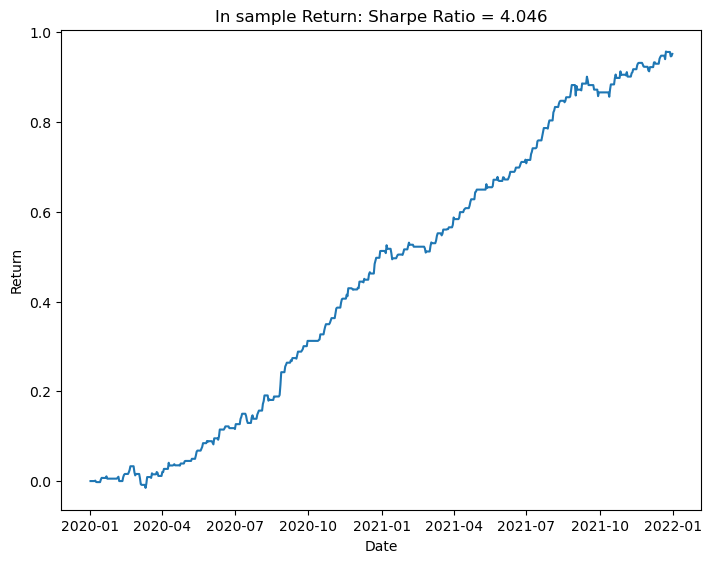

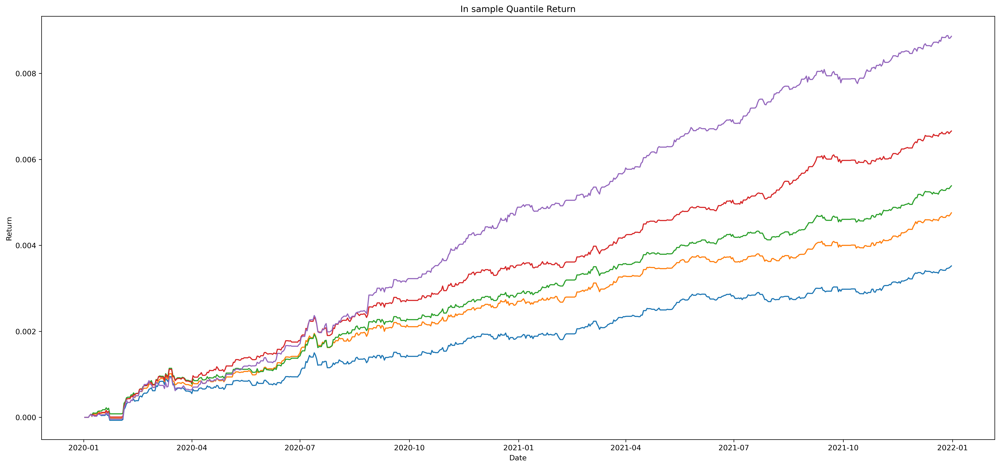

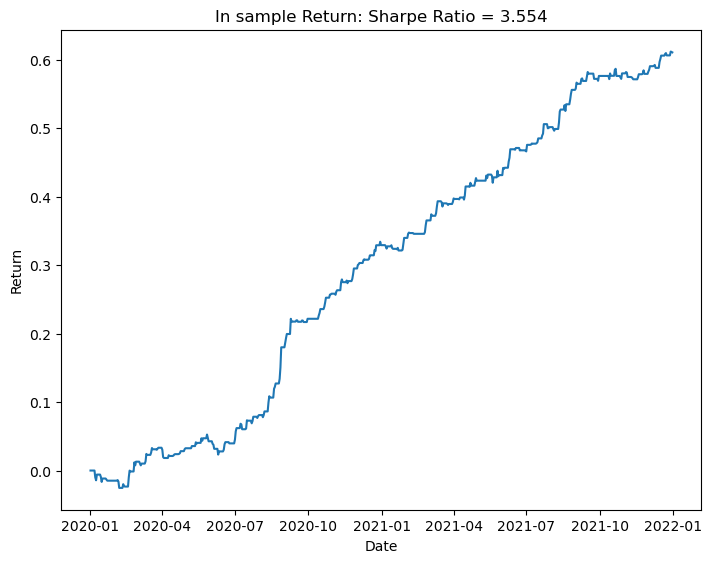

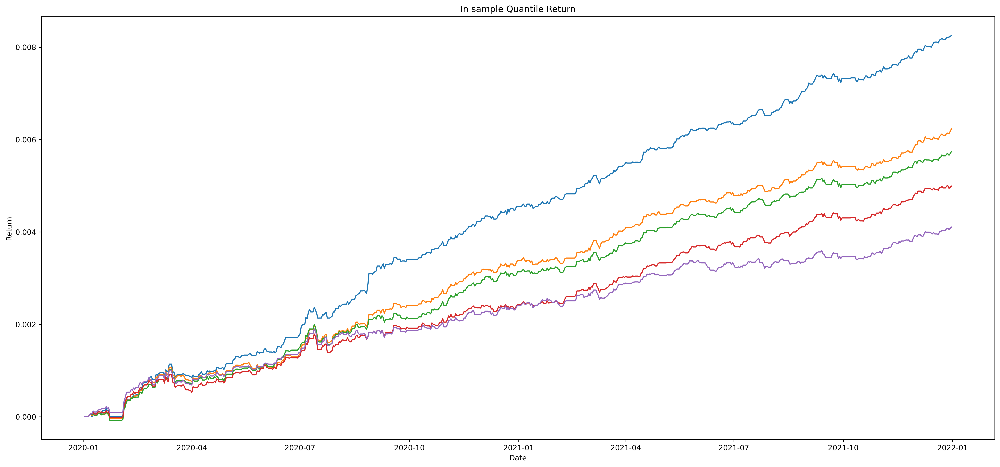

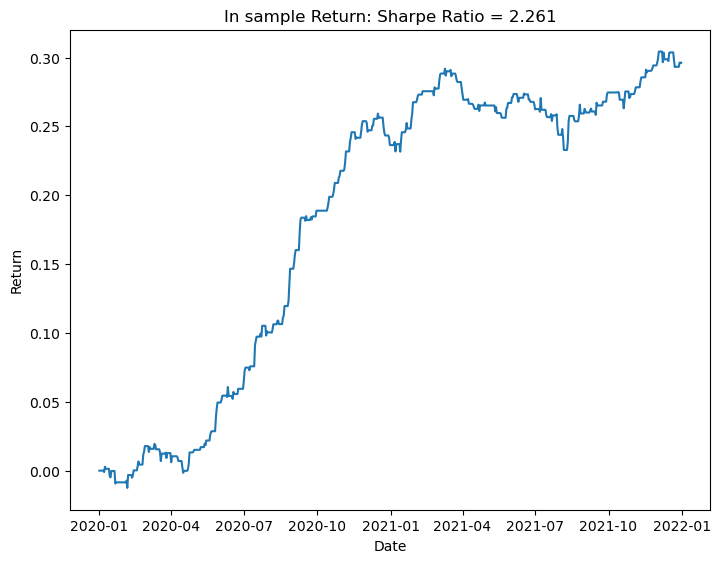

...

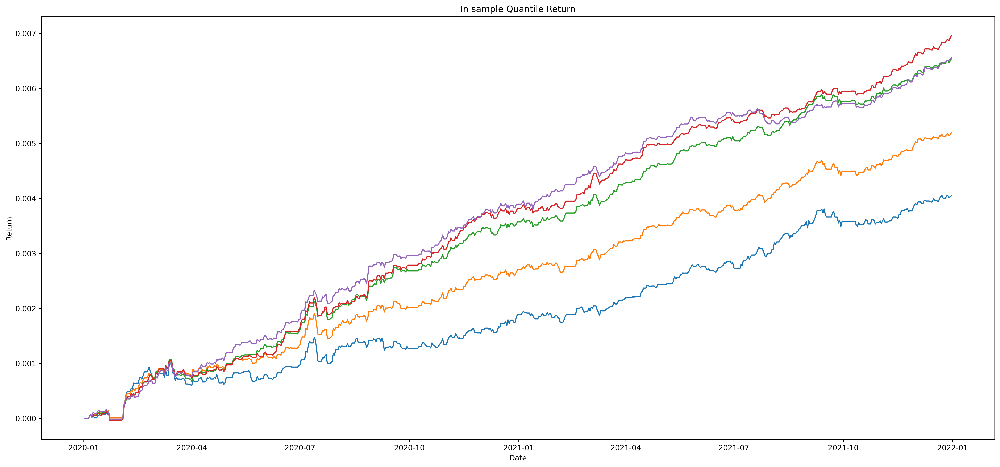

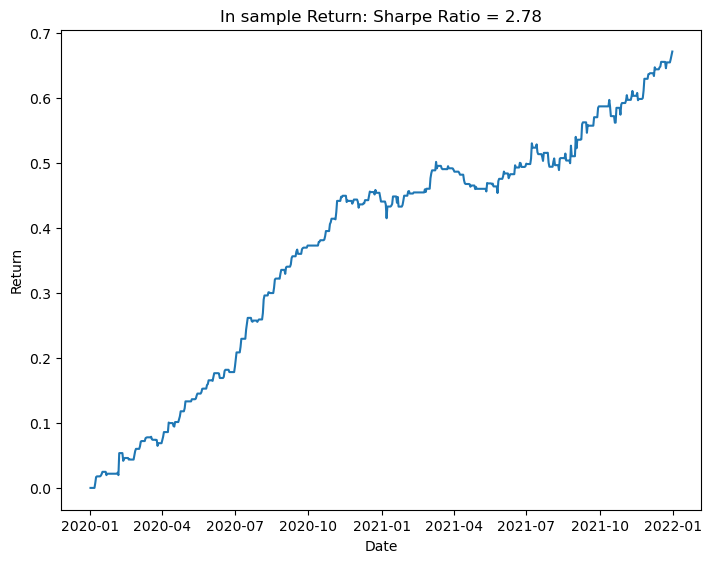

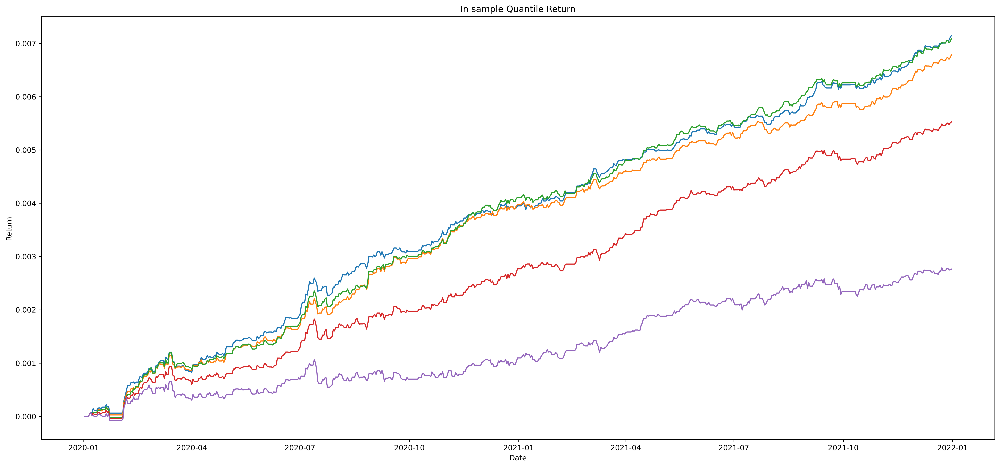

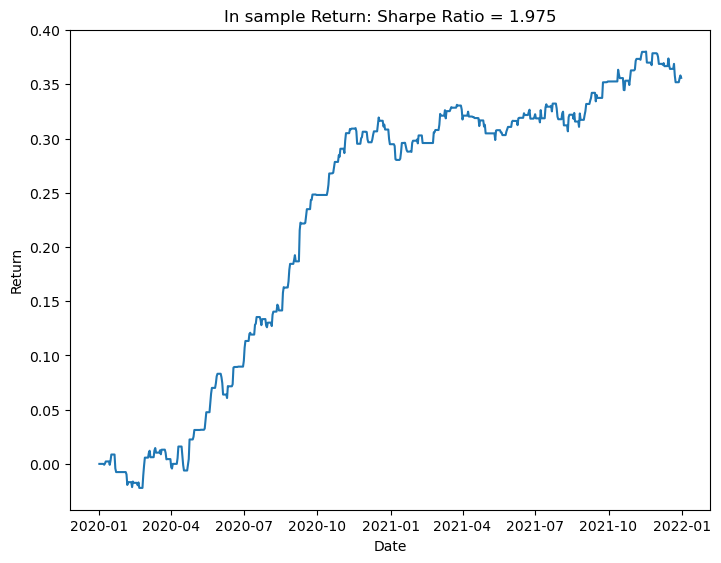

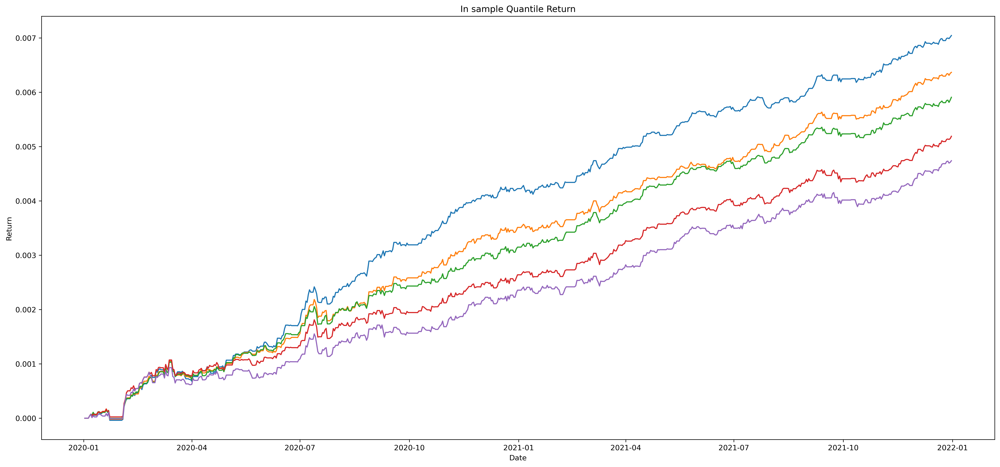

In [6]:

# 计算所有高频因子的性能表现
# 计算因子收益的参数
cost = 0.0005 # cost包含税之类的花费
lagging_day = 2 # 延迟2天
Q = 5
# 开始和结束时间
sdate = 0
edate = len(Close.index)

# 负责因子间查重
returns = pd.DataFrame()
returns_dict = {}

# TotalRet重采样
Open_day = Open.resample('1D').mean().fillna(0)
Close_day = Close.resample('1D').mean().fillna(0)
TotalRet = (Close_day - Open_day) / Open_day
# TotalRet = TotalRet.resample('1D').mean().fillna(0)
TotalRet = TotalRet.replace([np.inf, -np.inf], 0)

factor_comb_params = []
# 计算!
for factor_name, factor_formula in high_freq_factor.items():

	logger.info('For Factor {}...'.format(factor_name))

	factor_value = eval(factor_formula)
	factor_value.replace([np.inf, -np.inf], 0)
	factor_value = factor_value.fillna(0)
	factor_value = pn_TransNorm(factor_value)
	factor_value_day = factor_value.resample('1D').mean().fillna(0)

	# 样本内的表现
	sdate = 0
	edate = len(factor_value_day.index)
	factor_return_line, DIR = get_factor_return(factor_value_day, cost, lagging_day, sdate, edate)

	SR = get_sr(factor_return_line)
	AR = get_ar(factor_return_line)
	TO = get_to(factor_value_day)

	logger.info("In sample Factor Performance: SR:{} AR:{} TO:{} DIR:{}".format(SR, AR, TO, DIR))

	# 累计收益图
	fig = plt.figure()
	factor_return_line.fillna(0)

	ax = fig.add_axes([0, 0, 1, 1])
	ax.set_title("In sample Return: Sharpe Ratio = {}".format(SR))
	ax.set_xlabel("Date")
	ax.set_ylabel('Return')
	factor_return_line.fillna(0)
	ax.plot(factor_return_line.cumsum())
	returns[factor_name] = factor_return_line
	returns_dict[factor_name] = factor_return_line

	factor_comb_params.append([ SR, factor_value_day ])

	# 分位数收益图
	quantile_return_lines = get_quantile_return(factor_value_day, Q, sdate, edate, lagging_day, TotalRet)
	fig = plt.figure(dpi=300, figsize=(18, 8))
	ax = fig.add_axes([0, 0, 1, 1])
	ax.set_title("In sample Quantile Return")
	ax.set_xlabel('Date')
	ax.set_ylabel('Return')
	for quantile_return_line in quantile_return_lines:
		ax.plot(quantile_return_line.cumsum())

## 样本内夏普率加权

INFO: In sample sharp weighted: SR:0.001 AR:0.0 TO:0.749 DIR:1


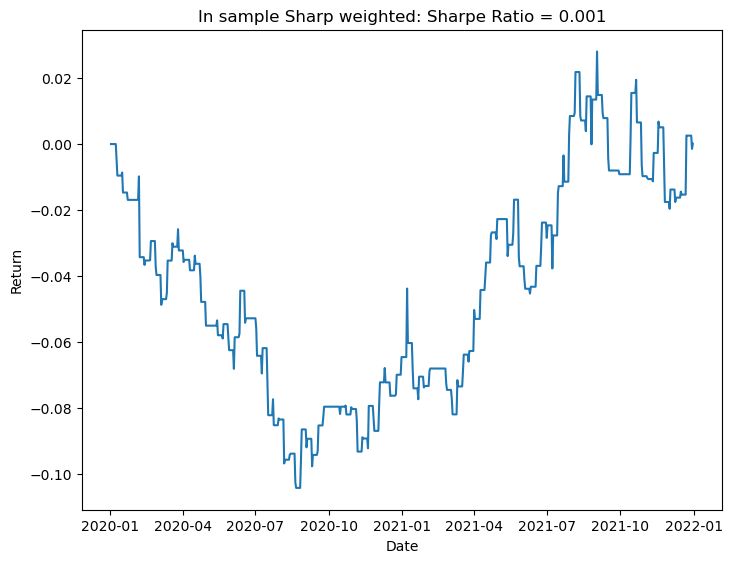

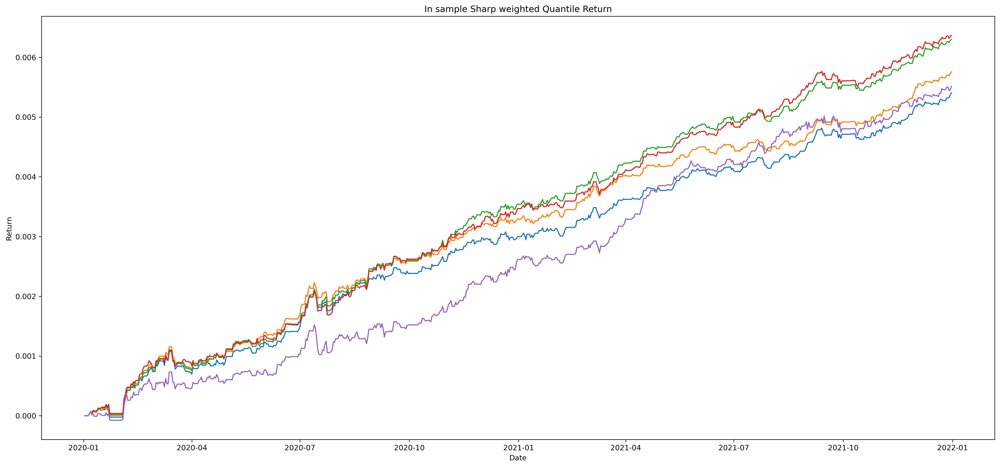

In [7]:
sharp_factor_value = None

for param in factor_comb_params:
	sr = param[0]
	factor_value_day = param[1]
	if sharp_factor_value is None:
		sharp_factor_value = sr * factor_value_day
	else:
		sharp_factor_value += sr * factor_value_day

sdate = 0
edate = len(sharp_factor_value.index)
cost = 0.0005
lagging_day = 2
Q = 5

sharp_return_line , DIR = get_factor_return(sharp_factor_value, cost, lagging_day, sdate, edate)
SR = get_sr(sharp_return_line)
AR = get_ar(sharp_return_line)
TO = get_to(sharp_factor_value)

logger.info("In sample sharp weighted: SR:{} AR:{} TO:{} DIR:{}".format(SR, AR, TO, DIR))

fig = plt.figure()
sharp_return_line.fillna(0)

ax = fig.add_axes([0, 0, 1, 1])
ax.set_title("In sample Sharp weighted: Sharpe Ratio = {}".format(SR))
ax.set_xlabel("Date")
ax.set_ylabel('Return')
sharp_return_line.fillna(0)
ax.plot(sharp_return_line.cumsum())

# 分位数收益图
quantile_return_lines = get_quantile_return(sharp_factor_value, Q, sdate, edate, lagging_day, TotalRet)
fig = plt.figure(dpi=300, figsize=(18, 8))
ax = fig.add_axes([0, 0, 1, 1])
ax.set_title("In sample Sharp weighted Quantile Return")
ax.set_xlabel('Date')
ax.set_ylabel('Return')
for quantile_return_line in quantile_return_lines:
	ax.plot(quantile_return_line.cumsum())

## 样本内马科维茨方法

INFO: Solved weights: [1.00968171e-02 2.38524478e-18 3.31263466e-01 2.29230665e-01
 7.88509653e-02 1.51788304e-18 3.09006677e-01 4.15514101e-02]
INFO: In sample mkwc weighted: SR:2.194 AR:0.152 TO:0.822 DIR:-1


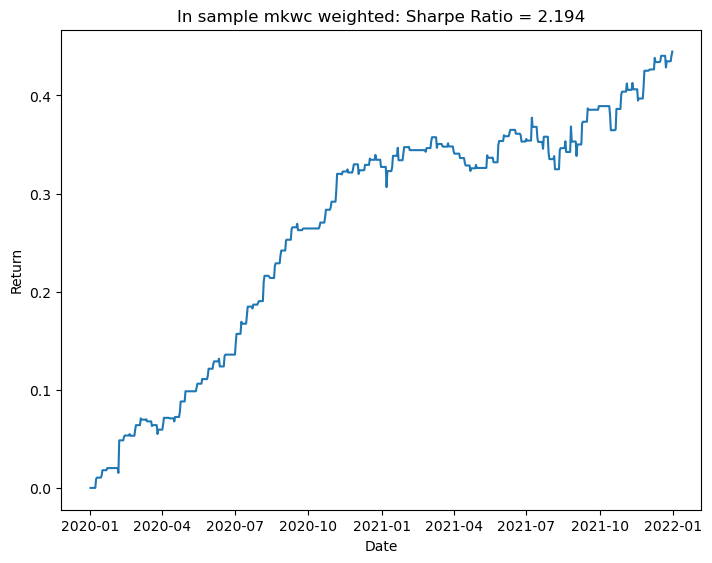

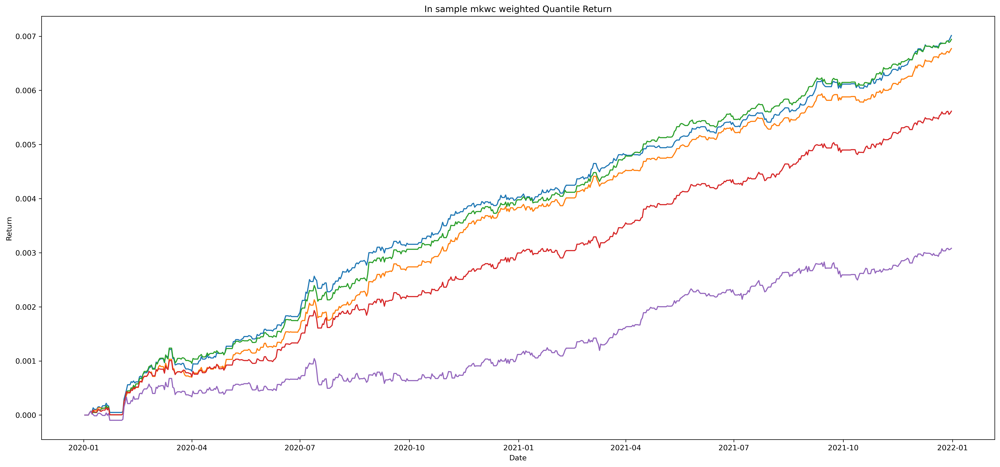

In [8]:
from scipy.optimize import minimize

all_factor_value = []

# 获取所有股票的因子时间序列
for param in factor_comb_params:
	all_factor_value.append(param[1].mean())

# 把Series转成numpy, 方便求解
all_factor_value = np.array([list(factor.values) for factor in all_factor_value])
all_factor_value = all_factor_value.T

returns_df = pd.DataFrame(all_factor_value)
mean_returns = returns_df.mean()
cov_matrix = returns_df.cov()

# 目标函数
def minimize_var(weights, mean_returns, cov_matrix):
	return np.dot(weights.T, np.dot(cov_matrix, weights))

# 权重个数
num_of_w = len(mean_returns)

# 约束条件1: 权重在(0, 1)之间
bounds =  tuple((0, 1) for x in range(num_of_w))
# 约束条件2: 权重之和等于1
cons = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
# 初始值
init_guess = len(mean_returns) * [1. / len(mean_returns)]

w = minimize(minimize_var, init_guess, args=(mean_returns, cov_matrix),
			 method='SLSQP', bounds=bounds, constraints=cons).x

logger.info('Solved weights: {}'.format(w))

mkwc_factor_value = None
w_id = 0
for param in factor_comb_params:
	factor_value = param[1]
	if mkwc_factor_value is None:
		mkwc_factor_value = w[w_id] * factor_value
	else:
		mkwc_factor_value += w[w_id] * factor_value
	w_id += 1

sdate = 0
edate = len(mkwc_factor_value.index)
cost = 0.0005
lagging_day = 2
Q = 5

mkwc_return_line , DIR = get_factor_return(mkwc_factor_value, cost, lagging_day, sdate, edate)
SR = get_sr(mkwc_return_line)
AR = get_ar(mkwc_return_line)
TO = get_to(mkwc_factor_value)

logger.info("In sample mkwc weighted: SR:{} AR:{} TO:{} DIR:{}".format(SR, AR, TO, DIR))

fig = plt.figure()
mkwc_return_line.fillna(0)

ax = fig.add_axes([0, 0, 1, 1])
ax.set_title("In sample mkwc weighted: Sharpe Ratio = {}".format(SR))
ax.set_xlabel("Date")
ax.set_ylabel('Return')
mkwc_return_line.fillna(0)
ax.plot(mkwc_return_line.cumsum())

# 分位数收益图
quantile_return_lines = get_quantile_return(mkwc_factor_value, Q, sdate, edate, lagging_day, TotalRet)
fig = plt.figure(dpi=300, figsize=(18, 8))
ax = fig.add_axes([0, 0, 1, 1])
ax.set_title("In sample mkwc weighted Quantile Return")
ax.set_xlabel('Date')
ax.set_ylabel('Return')
for quantile_return_line in quantile_return_lines:
	ax.plot(quantile_return_line.cumsum())

## 因子查重

In [9]:
# 高频因子间相关性
returns.corr().round(2).to_csv('./fuck/chachong.csv')

## 和官方因子查重

In [10]:
# 调用这个模块之后, 官方因子的值会被计算出来, 只需要调用一次即可
# 如果换了因子, 要查重只需要调用第二个模块即可
official_factors = { 
	#  crose section
	'官方因子1': 'High/Open-1',
	'官方因子2': 'Close/Low-1',
	'官方因子3': 'VWAP/Low-1',
	'官方因子4': 'VWAP/Open-1',
	'官方因子5': 'Open/ts_Delay(Open,1)-1',
	'官方因子6': 'High/ts_Delay(High,1)-1',
	'官方因子7': 'VWAP/ts_Delay(VWAP,1)-1',
	'官方因子8': 'High/ts_Decay(High,15)-1',
	'官方因子9': 'Low/ts_Decay(Low,15)-1',
	'官方因子10': 'ts_Stdev(Volume/ts_Delay(Volume,1)-1,15)',
	'官方因子11': 'ts_Kurtosis(Volume/ts_Delay(Volume,1)-1,15)',
	'官方因子12': 'Amount/(ts_Min(Amount,15) + ts_Min(Amount,15))-1',
}

official_returns = pd.DataFrame()
official_returns_dict = {}

for factor_name, factor_formula in official_factors.items():
	factor_value = eval(factor_formula)
	factor_value.replace([np.inf, -np.inf], 0)
	factor_value = factor_value.fillna(0)
	factor_value = pn_TransNorm(factor_value)
	factor_value_day = factor_value.resample('1D').mean().fillna(0)
	sdate = 0
	edate = len(factor_value_day.index)
	factor_return_line, _ = get_factor_return(factor_value_day, cost, lagging_day, sdate, edate)
	official_returns[factor_name] = factor_return_line.cumsum()
	official_returns_dict[factor_name] = factor_return_line.cumsum()

In [11]:
corr_index = list(high_freq_factor.keys())
corr_columns = list(official_factors.keys())
corr_data = []

for h_factor_name in corr_index:
	h_data = returns_dict[h_factor_name]
	corr_tmp = []
	for official_factor_name in corr_columns:
		o_data = official_returns_dict[official_factor_name]
		corr_tmp.append(h_data.corr(o_data))
	corr_data.append(corr_tmp)

corr_matrix = pd.DataFrame(
	np.array(corr_data),
	corr_index,
	corr_columns
)
corr_matrix.round(2).to_csv('./fuck/official_chachong.csv')

## 导入样本外数据 (2022-01-01到2022-12-31)

In [12]:
# 导入分钟交易数据
minute_data_path = './data/minute_data'
logger.debug('正在加载分钟交易数据...')
stock_id = pd.read_csv('{}/{}'.format(
	minute_data_path,
	'446.csv',
), dtype=str).values.reshape(-1).tolist()

sdate = 20220101
edate = 20221231

# 开盘价
Open = pd.DataFrame()
Close = pd.DataFrame()
High = pd.DataFrame()
Low = pd.DataFrame()
Volume = pd.DataFrame()
Amount = pd.DataFrame()


years = ['2017', '2017', '2018', '2019', '2020-2022']
file_dict = {}
for year in years:
	file_prefix = '{}/{}/'.format(minute_data_path, year)
	file_dict[file_prefix] = []
	for file in os.listdir(file_prefix):
		file_dict[file_prefix].append(file)

for prefix, files in file_dict.items():
	logger.debug('Importing data in {}...'.format(prefix))
	for i in tqdm(range(len(files))):
		file = files[i]
		path = prefix + file
		date = int(file.split('_')[1].split('.')[0])
		if date < sdate or date > edate:
			continue
		min_data = mat73.loadmat(path)

		# Get Dataframe columns (stock_id)
		columns = list(set(stock_id) & set(min_data['LocalID']))
		columns.sort()
		# Get DataFrame index (minutes)
		date_timestamp = matlab_time_to_unix_timestap(min_data['Date'])
		parsed_date = datetime.fromtimestamp(date_timestamp)
		parsed_date = parsed_date.strftime('%Y-%m-%d')
		
		minute_list = []
		for i in range(len(min_data['Hour'])):
			hour = min_data['Hour'][i]
			minute = min_data['Minute'][i]
			minute_list.append(
				'{} {}:{}:59'.format(parsed_date, int(hour), int(minute))
			)
		
		# Get DataFrame
		open = pd.DataFrame(
			min_data['Open'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		close = pd.DataFrame(
			min_data['Close'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		high = pd.DataFrame(
			min_data['High'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		low = pd.DataFrame(
			min_data['Low'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		volume = pd.DataFrame(
			min_data['Volume'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		amount = pd.DataFrame(
			min_data['Amount'],
			columns=min_data['LocalID'],
			index=minute_list
		)
		Open = pd.concat([Open, open.loc[:, columns]], axis=0)
		Close = pd.concat([Close, close.loc[:, columns]], axis=0)
		High = pd.concat([High, high.loc[:, columns]], axis=0)
		Low = pd.concat([Low, low.loc[:, columns]], axis=0)
		Volume = pd.concat([Volume, volume.loc[:, columns]], axis=0)
		Amount = pd.concat([Amount, amount.loc[:, columns]], axis=0)

# 获取交易时刻的数据
trading_day = Volume.sum(1) > 0
Open = Open[trading_day].ffill()
Close = Close[trading_day].ffill()
High = High[trading_day].ffill()
Low = Low[trading_day].ffill()
Volume = Volume[trading_day]
Amount = Amount[trading_day]

Open.index = pd.to_datetime(Open.index)
Close.index = pd.to_datetime(Close.index)
High.index = pd.to_datetime(High.index)
Low.index = pd.to_datetime(Low.index)
Volume.index = pd.to_datetime(Volume.index)
Amount.index = pd.to_datetime(Amount.index)
VWAP = Amount / Volume
TotalRet = (Close - Open) / Open
logger.debug('导入成功!')

DEBUG: 正在加载分钟交易数据...
DEBUG: Importing data in ./data/minute_data/2017/...
100%|██████████| 244/244 [00:00<00:00, 1877816.84it/s]
DEBUG: Importing data in ./data/minute_data/2018/...
100%|██████████| 243/243 [00:00<00:00, 1926684.07it/s]
DEBUG: Importing data in ./data/minute_data/2019/...
100%|██████████| 244/244 [00:00<00:00, 2050922.20it/s]
DEBUG: Importing data in ./data/minute_data/2020-2022/...
100%|██████████| 569/569 [40:42<00:00,  4.29s/it]  
DEBUG: 导入成功!


## 样本外夏普, Quantile

INFO: For Factor 高频收益方差...
INFO: In sample Factor Performance: SR:2.688 AR:0.162 TO:0.532 DIR:1
INFO: For Factor 高频收益峰度...
INFO: In sample Factor Performance: SR:2.29 AR:0.119 TO:0.956 DIR:-1
INFO: For Factor 高频收益偏度...
INFO: In sample Factor Performance: SR:2.614 AR:0.104 TO:1.043 DIR:-1
INFO: For Factor 五分钟特质残差峰度...
INFO: In sample Factor Performance: SR:1.982 AR:0.074 TO:1.055 DIR:-1
INFO: For Factor 上下午成交量比值...
INFO: In sample Factor Performance: SR:2.181 AR:0.115 TO:0.966 DIR:1
INFO: For Factor 一分钟ILLIQ...
INFO: In sample Factor Performance: SR:1.131 AR:0.066 TO:0.486 DIR:1
INFO: For Factor 趋势强度...
INFO: In sample Factor Performance: SR:3.277 AR:0.323 TO:0.981 DIR:-1
INFO: For Factor 五分钟交易额分布...
INFO: In sample Factor Performance: SR:2.979 AR:0.183 TO:1.015 DIR:-1


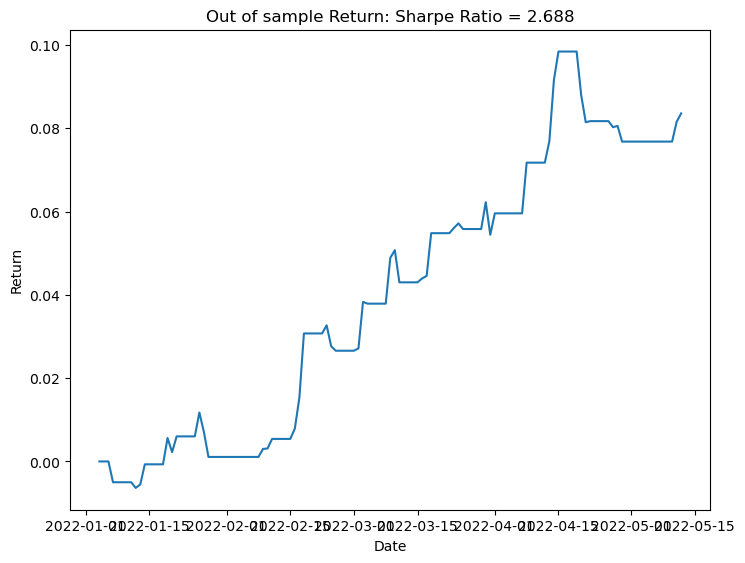

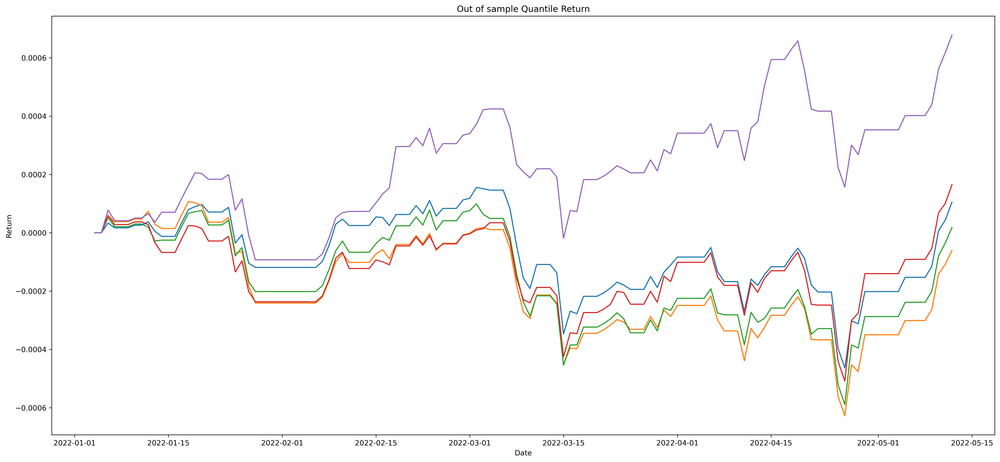

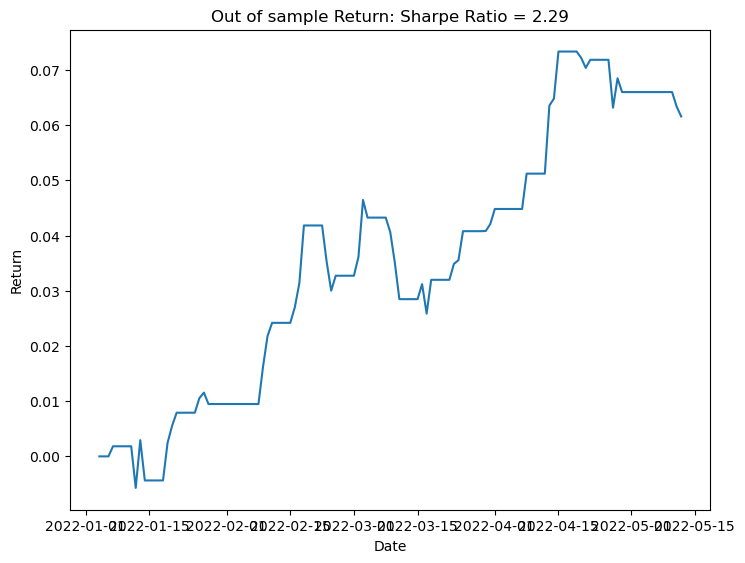

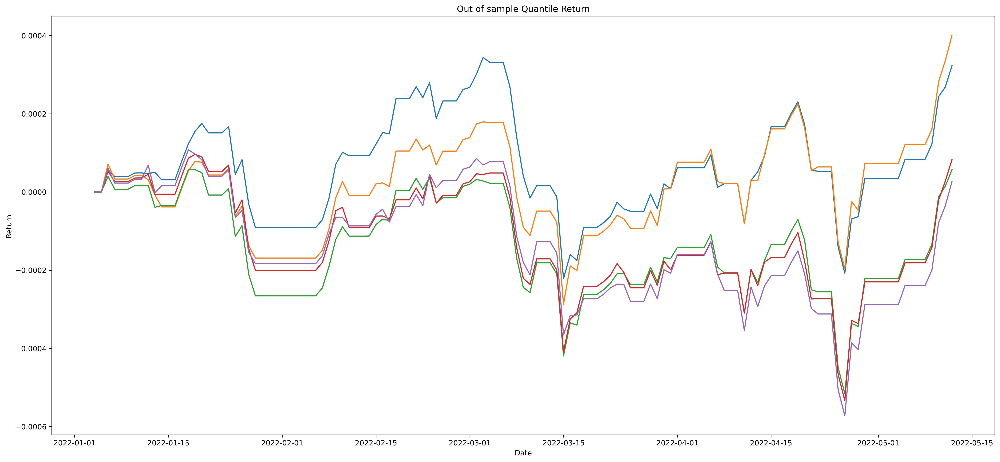

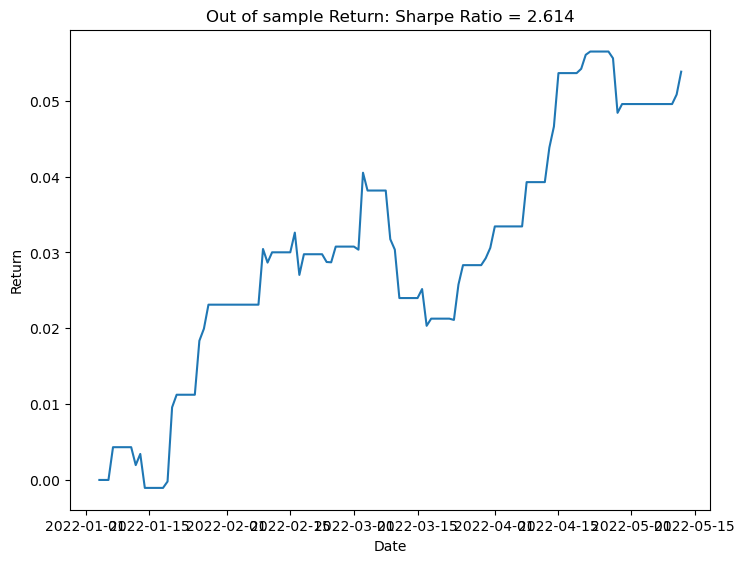

...

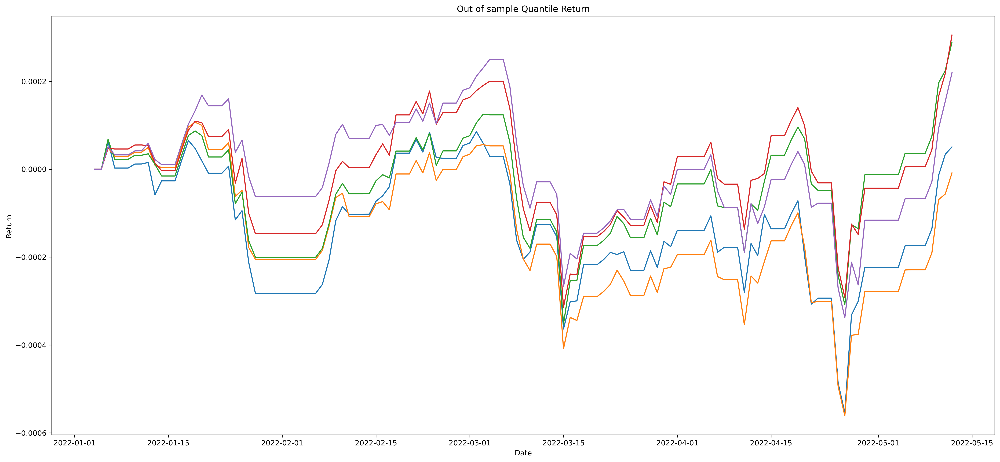

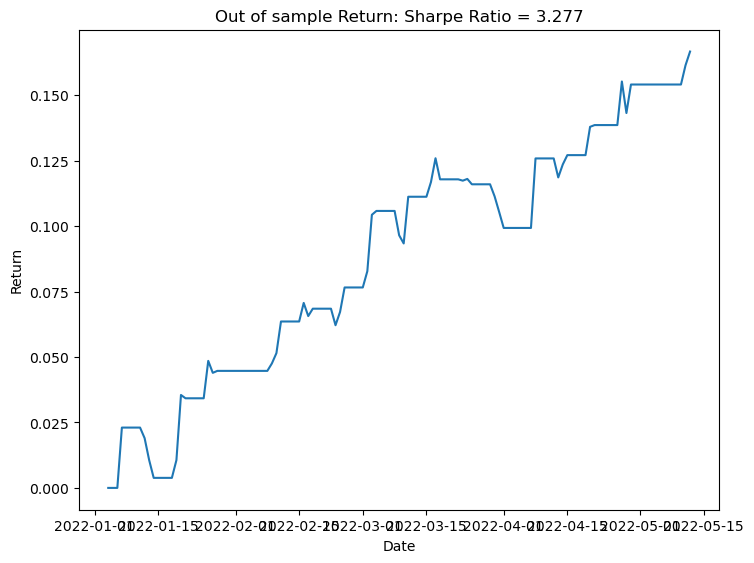

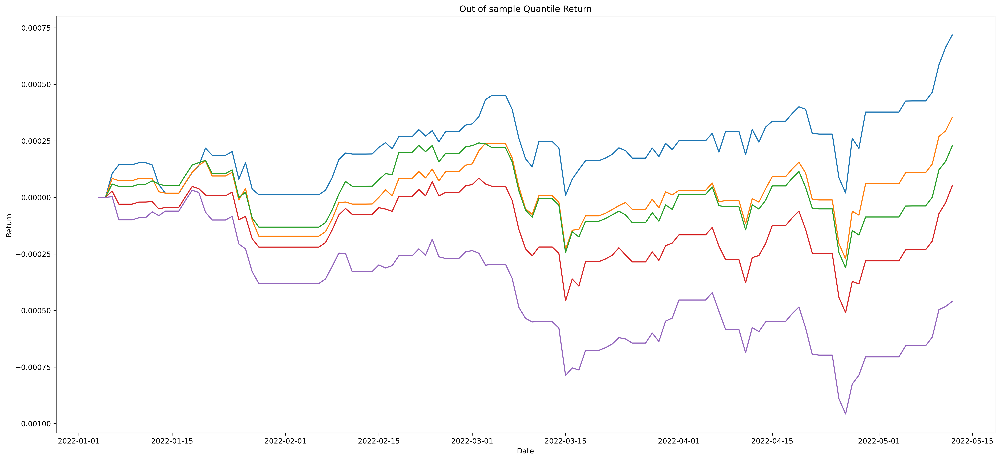

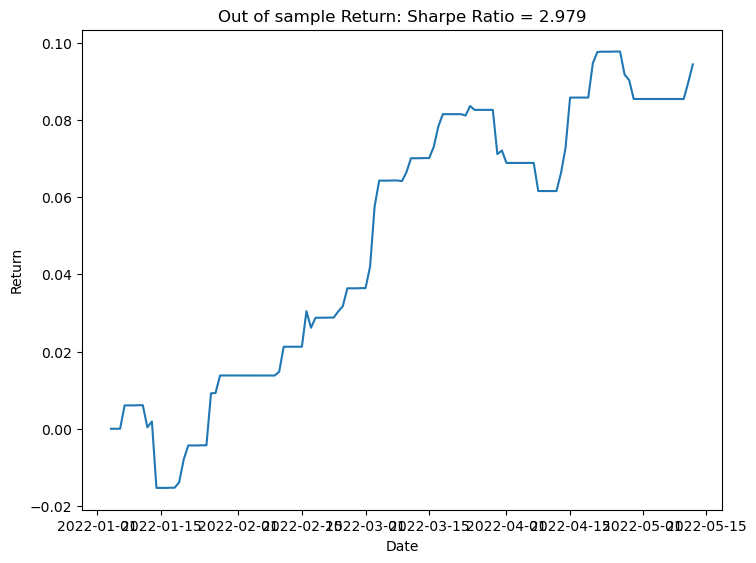

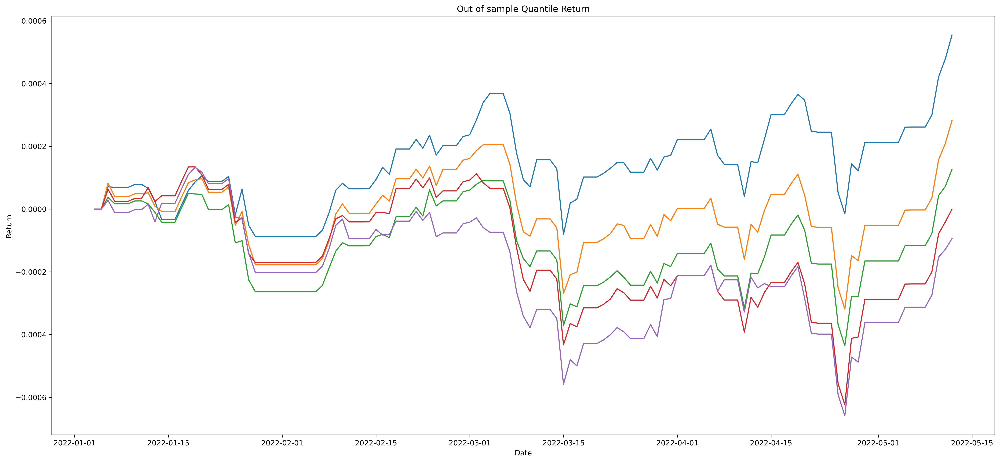

In [13]:
# 计算所有高频因子的性能表现
# 计算因子收益的参数
cost = 0.0005 # cost包含税之类的花费
lagging_day = 2 # 延迟2天
Q = 5
# 开始和结束时间
sdate = 0
edate = len(Close.index)


# TotalRet重采样
Open_day = Open.resample('1D').mean().fillna(0)
Close_day = Close.resample('1D').mean().fillna(0)
TotalRet = (Close_day - Open_day) / Open_day
# TotalRet = TotalRet.resample('1D').mean().fillna(0)
TotalRet = TotalRet.replace([np.inf, -np.inf], 0)

# 计算!
factor_idx = 0
for factor_name, factor_formula in high_freq_factor.items():

	logger.info('For Factor {}...'.format(factor_name))

	factor_value = eval(factor_formula)
	factor_value.replace([np.inf, -np.inf], 0)
	factor_value = factor_value.fillna(0)
	factor_value = pn_TransNorm(factor_value)
	factor_value_day = factor_value.resample('1D').mean().fillna(0)

	factor_comb_params[factor_idx][1] = factor_value_day
	factor_idx += 1

	# 样本内的表现
	sdate = 0
	edate = len(factor_value_day.index)
	factor_return_line, DIR = get_factor_return(factor_value_day, cost, lagging_day, sdate, edate)

	SR = get_sr(factor_return_line)
	AR = get_ar(factor_return_line)
	TO = get_to(factor_value_day)

	logger.info("In sample Factor Performance: SR:{} AR:{} TO:{} DIR:{}".format(SR, AR, TO, DIR))

	# 累计收益图
	fig = plt.figure()
	factor_return_line.fillna(0)

	ax = fig.add_axes([0, 0, 1, 1])
	ax.set_title("Out of sample Return: Sharpe Ratio = {}".format(SR))
	ax.set_xlabel("Date")
	ax.set_ylabel('Return')
	factor_return_line.fillna(0)
	ax.plot(factor_return_line.cumsum())

	# 分位数收益图
	quantile_return_lines = get_quantile_return(factor_value_day, Q, sdate, edate, lagging_day, TotalRet)
	fig = plt.figure(dpi=300, figsize=(18, 8))
	ax = fig.add_axes([0, 0, 1, 1])
	ax.set_title("Out of sample Quantile Return")
	ax.set_xlabel('Date')
	ax.set_ylabel('Return')
	for quantile_return_line in quantile_return_lines:
		ax.plot(quantile_return_line.cumsum())

## 样本外夏普率加权

INFO: In sample sharp weighted: SR:1.374 AR:0.084 TO:0.863 DIR:-1


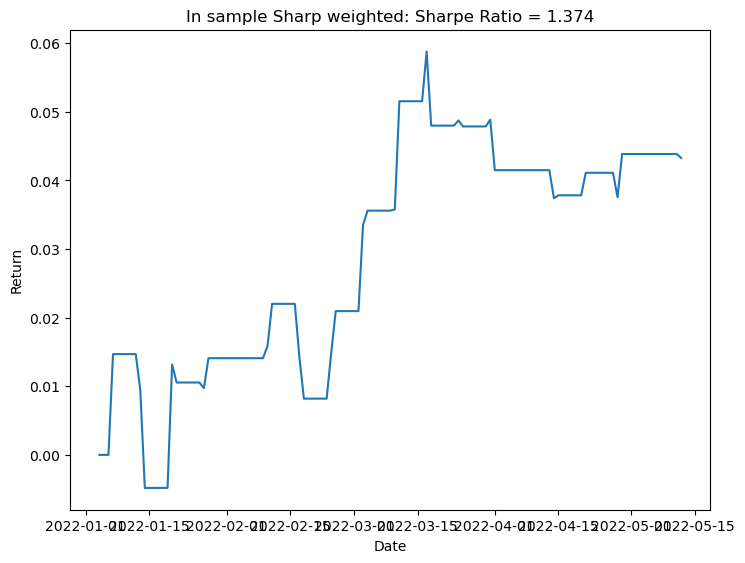

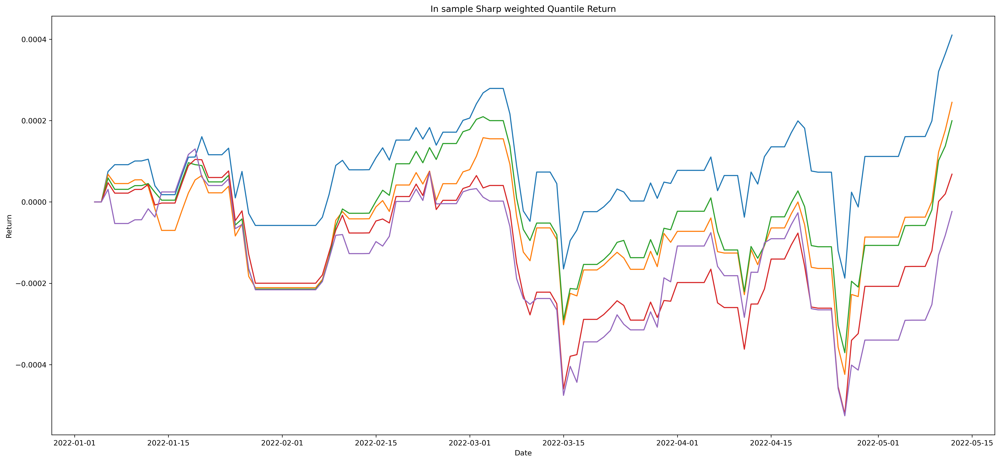

In [14]:

sharp_factor_value = None

for param in factor_comb_params:
	sr = param[0]
	factor_value_day = param[1]
	if sharp_factor_value is None:
		sharp_factor_value = sr * factor_value_day
	else:
		sharp_factor_value += sr * factor_value_day

sdate = 0
edate = len(sharp_factor_value.index)
cost = 0.0005
lagging_day = 2
Q = 5

sharp_return_line , DIR = get_factor_return(sharp_factor_value, cost, lagging_day, sdate, edate)
SR = get_sr(sharp_return_line)
AR = get_ar(sharp_return_line)
TO = get_to(sharp_factor_value)

logger.info("In sample sharp weighted: SR:{} AR:{} TO:{} DIR:{}".format(SR, AR, TO, DIR))

fig = plt.figure()
sharp_return_line.fillna(0)

ax = fig.add_axes([0, 0, 1, 1])
ax.set_title("In sample Sharp weighted: Sharpe Ratio = {}".format(SR))
ax.set_xlabel("Date")
ax.set_ylabel('Return')
sharp_return_line.fillna(0)
ax.plot(sharp_return_line.cumsum())

# 分位数收益图
quantile_return_lines = get_quantile_return(sharp_factor_value, Q, sdate, edate, lagging_day, TotalRet)
fig = plt.figure(dpi=300, figsize=(18, 8))
ax = fig.add_axes([0, 0, 1, 1])
ax.set_title("In sample Sharp weighted Quantile Return")
ax.set_xlabel('Date')
ax.set_ylabel('Return')
for quantile_return_line in quantile_return_lines:
	ax.plot(quantile_return_line.cumsum())

## 样本外马科维茨

INFO: In sample mkwc weighted: SR:2.346 AR:0.178 TO:0.993 DIR:-1


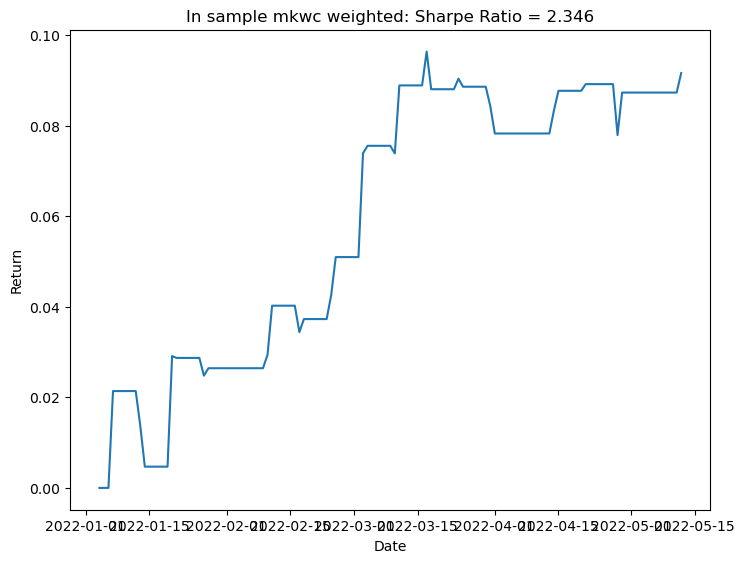

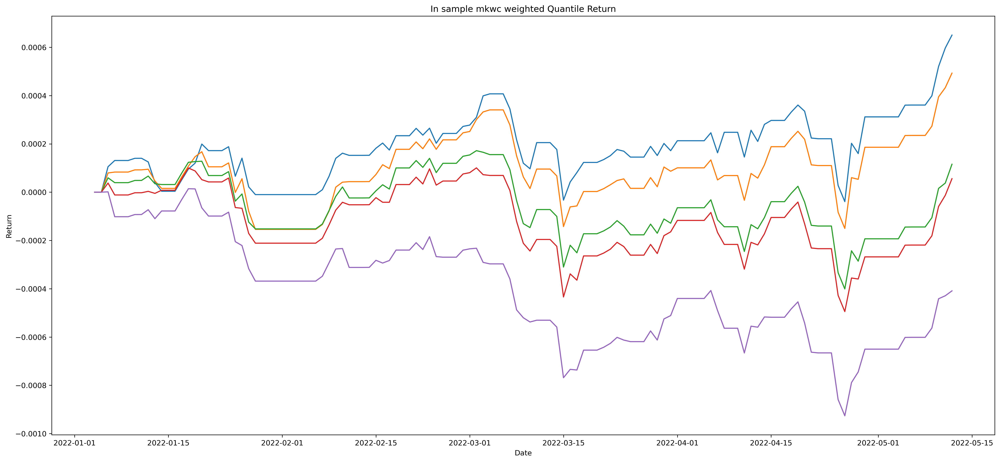

In [15]:
mkwc_factor_value = None
w_id = 0
for param in factor_comb_params:
	factor_value = param[1]
	if mkwc_factor_value is None:
		mkwc_factor_value = w[w_id] * factor_value
	else:
		mkwc_factor_value += w[w_id] * factor_value
	w_id += 1

sdate = 0
edate = len(mkwc_factor_value.index)
cost = 0.0005
lagging_day = 2
Q = 5

mkwc_return_line , DIR = get_factor_return(mkwc_factor_value, cost, lagging_day, sdate, edate)
SR = get_sr(mkwc_return_line)
AR = get_ar(mkwc_return_line)
TO = get_to(mkwc_factor_value)

logger.info("In sample mkwc weighted: SR:{} AR:{} TO:{} DIR:{}".format(SR, AR, TO, DIR))

fig = plt.figure()
mkwc_return_line.fillna(0)

ax = fig.add_axes([0, 0, 1, 1])
ax.set_title("In sample mkwc weighted: Sharpe Ratio = {}".format(SR))
ax.set_xlabel("Date")
ax.set_ylabel('Return')
mkwc_return_line.fillna(0)
ax.plot(mkwc_return_line.cumsum())

# 分位数收益图
quantile_return_lines = get_quantile_return(mkwc_factor_value, Q, sdate, edate, lagging_day, TotalRet)
fig = plt.figure(dpi=300, figsize=(18, 8))
ax = fig.add_axes([0, 0, 1, 1])
ax.set_title("In sample mkwc weighted Quantile Return")
ax.set_xlabel('Date')
ax.set_ylabel('Return')
for quantile_return_line in quantile_return_lines:
	ax.plot(quantile_return_line.cumsum())